# Data loading

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
plt.style.use('fivethirtyeight')
import seaborn as sns
import missingno as msno
import plotly.express as px


from sklearn.metrics import mean_squared_error
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from sklearn.ensemble import RandomForestRegressor

In [2]:
df = pd.read_csv('Train.csv')
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 86584 entries, 0 to 86583
Data columns (total 14 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   ID_Zindi            86584 non-null  object 
 1   Date                86584 non-null  object 
 2   ID                  86584 non-null  object 
 3   LAT                 86584 non-null  float64
 4   LON                 86584 non-null  float64
 5   Precipitation       86584 non-null  float64
 6   LST                 46798 non-null  float64
 7   AAI                 73709 non-null  float64
 8   CloudFraction       73709 non-null  float64
 9   NO2_strat           73709 non-null  float64
 10  NO2_total           73709 non-null  float64
 11  NO2_trop            51111 non-null  float64
 12  TropopausePressure  73709 non-null  float64
 13  GT_NO2              82051 non-null  float64
dtypes: float64(11), object(3)
memory usage: 9.2+ MB


In [3]:
df['ID_Zindi'].nunique()

86582

In [4]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
LAT,86584.0,45.421456,0.225409,44.924694,45.249544,45.478996,45.601232,45.889734
LON,86584.0,10.014272,1.056637,8.736497,9.195325,9.611738,10.683357,12.590682
Precipitation,86584.0,2.585528,7.617394,0.000000,0.000000,0.000000,0.000000,135.396805
LST,46798.0,299.268841,10.927167,253.200000,290.920000,300.760000,307.940000,327.840000
AAI,73709.0,-1.274999,0.693003,-5.196266,-1.749425,-1.349746,-0.878857,2.143020
CloudFraction,73709.0,0.200606,0.259607,0.000000,0.023900,0.078478,0.278451,1.000000
NO2_strat,73709.0,0.000045,0.000012,0.000013,0.000034,0.000047,0.000056,0.000073
NO2_total,73709.0,0.000156,0.000103,-0.000012,0.000100,0.000122,0.000173,0.002047
NO2_trop,51111.0,0.000105,0.000092,-0.000025,0.000047,0.000071,0.000129,0.001097
TropopausePressure,73709.0,16655.112392,3000.748790,8614.349685,14432.114060,16711.190570,19252.648570,24449.007150


In [5]:
df.head()

,ID_Zindi,Date,ID,LAT,LON,Precipitation,LST,AAI,CloudFraction,NO2_strat,NO2_total,NO2_trop,TropopausePressure,GT_NO2
0,ID_ENTGC7,1/1/19,PD01,45.601585,11.903551,0.000000,NaN,0.230527,0.559117,0.000024,0.000117,NaN,14440.82126,31.0
1,ID_8JCCXC,1/1/19,PD04,45.371005,11.840830,3.047342,NaN,-0.074006,0.869309,0.000024,0.000127,NaN,14441.79815,42.0
2,ID_V3136Z,1/1/19,RO01,45.045825,12.060869,0.000000,NaN,0.024470,0.674160,0.000024,0.000086,NaN,14437.38294,31.0
3,ID_KRVZDJ,1/1/19,RO02,45.104075,11.553241,1.200467,NaN,-0.010442,0.920054,0.000024,0.000124,NaN,14440.83831,30.0
4,ID_PR351A,1/1/19,RO03,45.038758,11.790152,1.274564,NaN,-0.176178,0.747464,0.000024,0.000116,NaN,14438.79037,58.0


## Duplication check

In [6]:
df.duplicated().sum()

0

## Missing value check

In [7]:
(df.isnull().sum()/df.shape[0]) * 100

ID_Zindi               0.000000
Date                   0.000000
ID                     0.000000
LAT                    0.000000
LON                    0.000000
Precipitation          0.000000
LST                   45.950753
AAI                   14.869953
CloudFraction         14.869953
NO2_strat             14.869953
NO2_total             14.869953
NO2_trop              40.969463
TropopausePressure    14.869953
GT_NO2                 5.235378
dtype: float64

<Axes: >

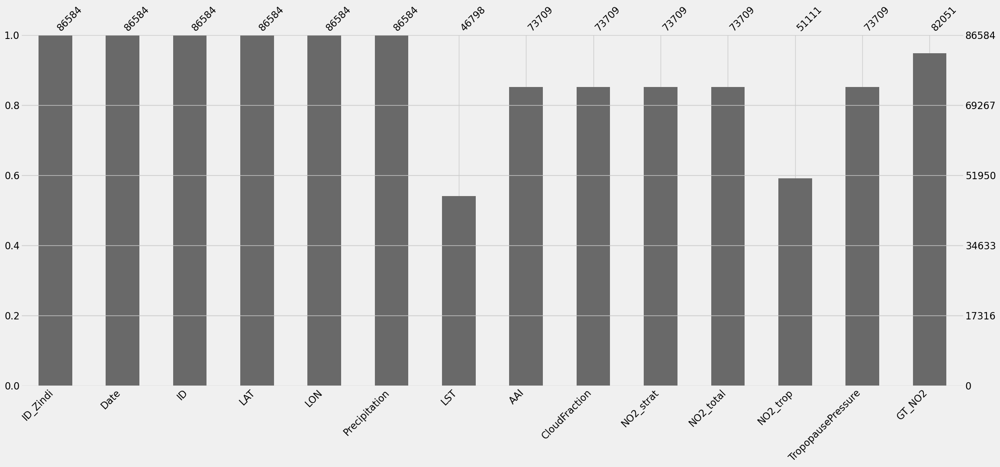

In [8]:
msno.bar(df)

<Axes: >

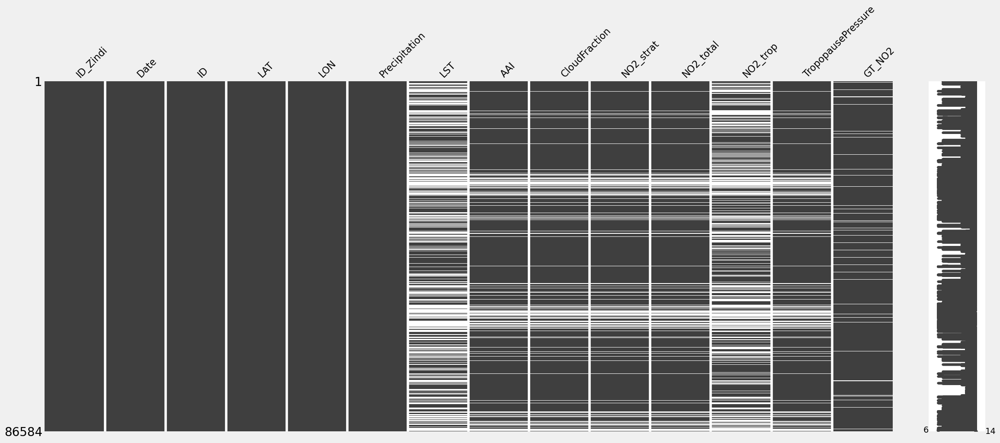

In [9]:
msno.matrix(df)

<Axes: >

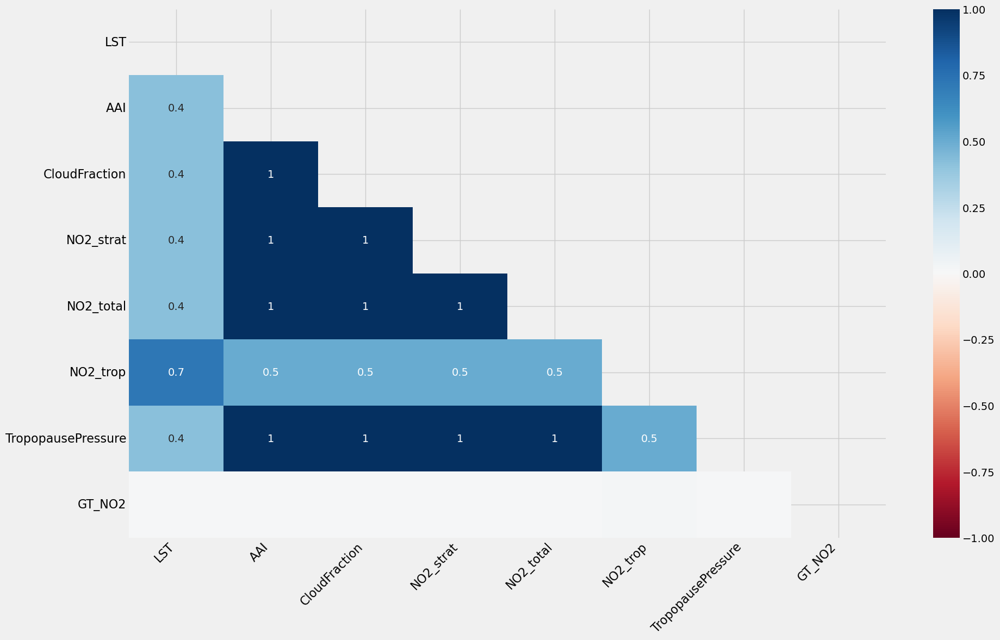

In [10]:
msno.heatmap(df)

# EDA 

# Uni-variate

In [11]:
def hist_boxplot(data, feature, figsize = (12,7),kde = True, bins=None):
    f2, (ax_box2, ax_hist2) = plt.subplots(
        nrows = 2,
        sharex= True,
        gridspec_kw ={'height_ratios': (0.25,0.75)},
        figsize = figsize)
    sns.boxplot(data=data, x =feature, ax = ax_box2, showmeans = True, color = 'violet')

    if bins:
        sns.histplot(data=data, x =feature, kde = kde, ax = ax_hist2, bins=bins, palette = 'winter')

    else:
        sns.histplot(data=data, x =feature, kde = kde, ax = ax_hist2, palette = 'winter')
    ax_hist2.axvline(data[feature].mean(), color = 'green', linestyle = "--")
    ax_hist2.axvline(data[feature].median(), color = 'black', linestyle = "-")

In [12]:
num_df = df.select_dtypes(include=np.number)

C:\Users\leeno\AppData\Local\Temp\ipykernel_31936\1706145024.py:13: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.histplot(data=data, x =feature, kde = kde, ax = ax_hist2, palette = 'winter')


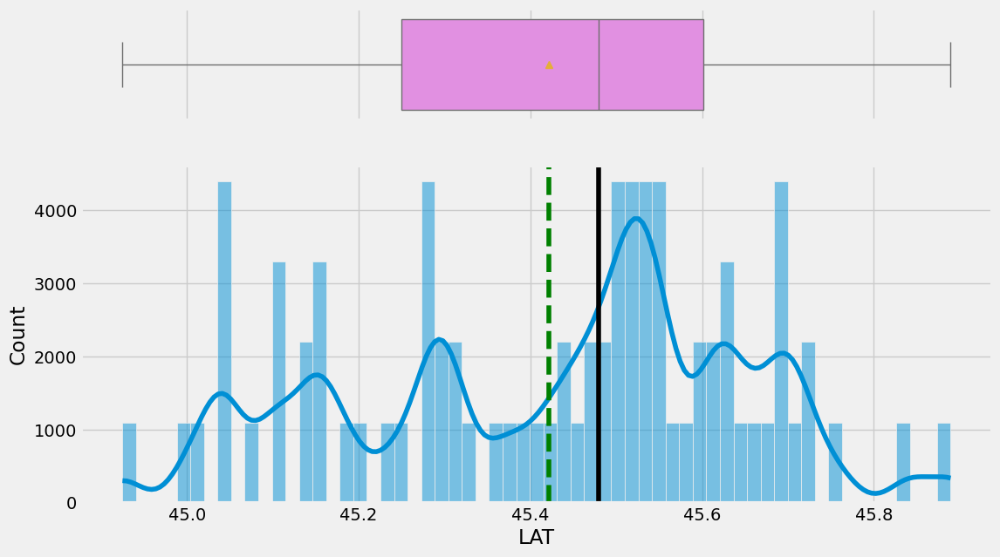

C:\Users\leeno\AppData\Local\Temp\ipykernel_31936\1706145024.py:13: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.histplot(data=data, x =feature, kde = kde, ax = ax_hist2, palette = 'winter')


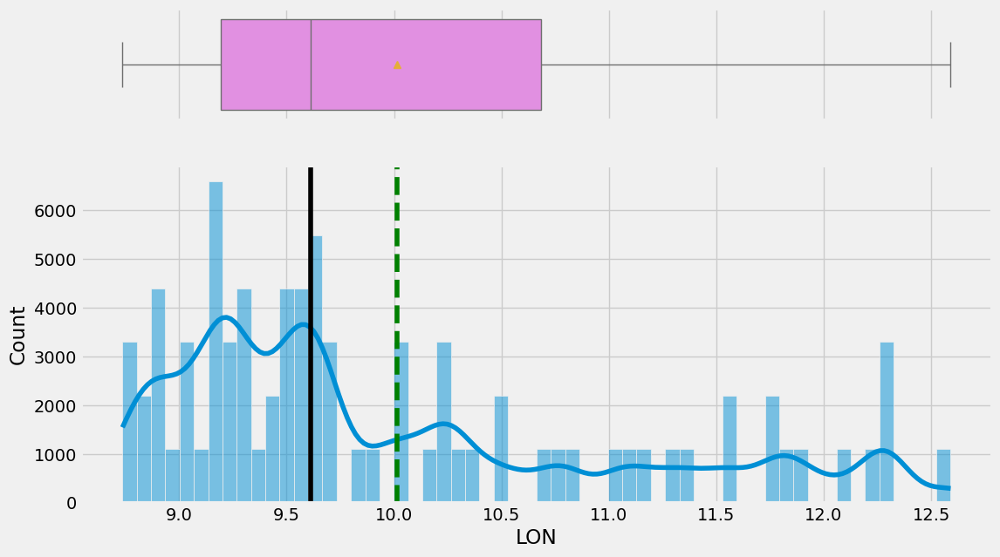

C:\Users\leeno\AppData\Local\Temp\ipykernel_31936\1706145024.py:13: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.histplot(data=data, x =feature, kde = kde, ax = ax_hist2, palette = 'winter')


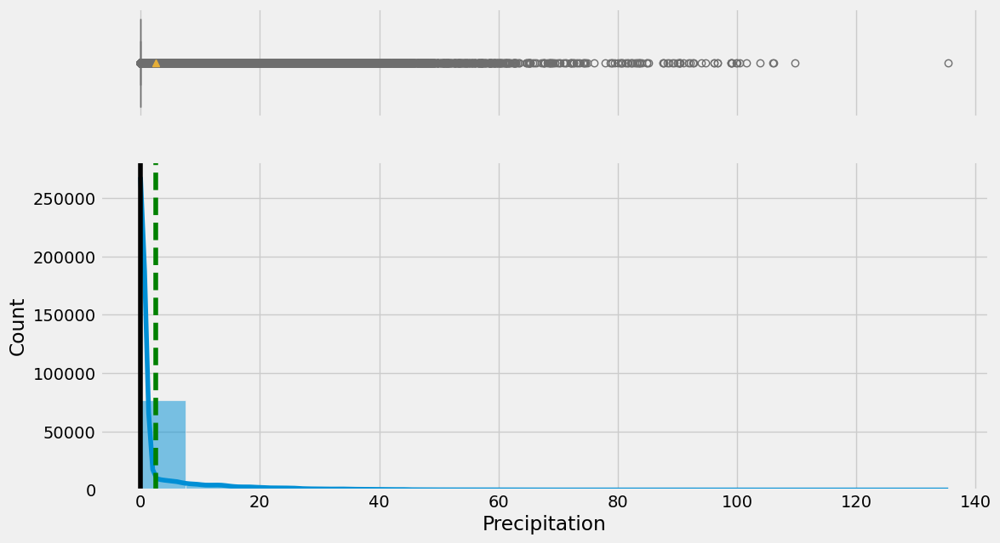

C:\Users\leeno\AppData\Local\Temp\ipykernel_31936\1706145024.py:13: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.histplot(data=data, x =feature, kde = kde, ax = ax_hist2, palette = 'winter')


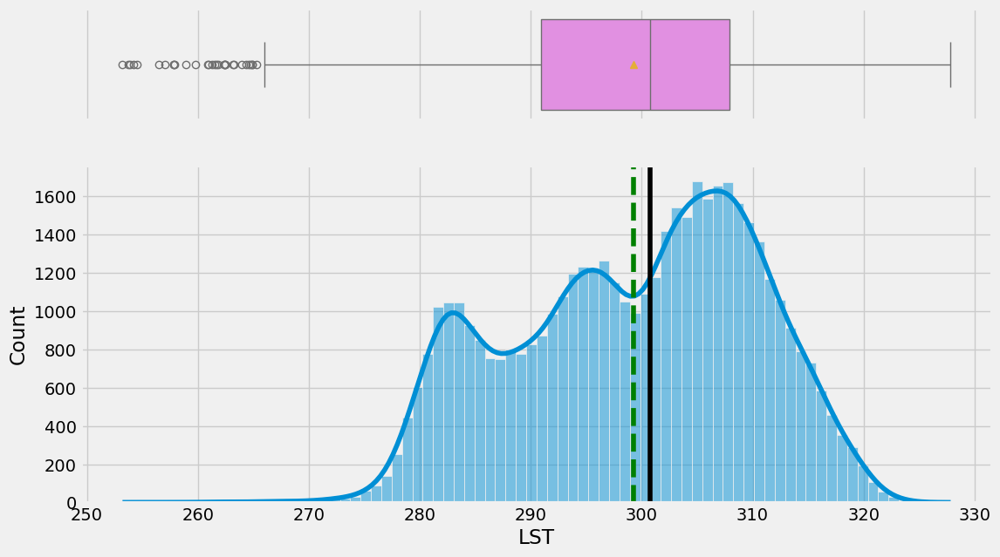

C:\Users\leeno\AppData\Local\Temp\ipykernel_31936\1706145024.py:13: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.histplot(data=data, x =feature, kde = kde, ax = ax_hist2, palette = 'winter')


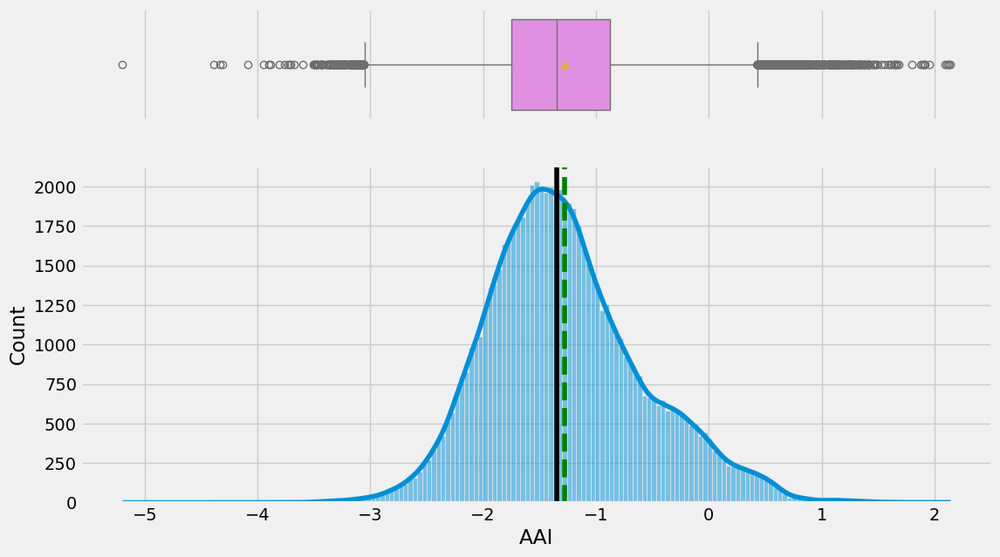

C:\Users\leeno\AppData\Local\Temp\ipykernel_31936\1706145024.py:13: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.histplot(data=data, x =feature, kde = kde, ax = ax_hist2, palette = 'winter')


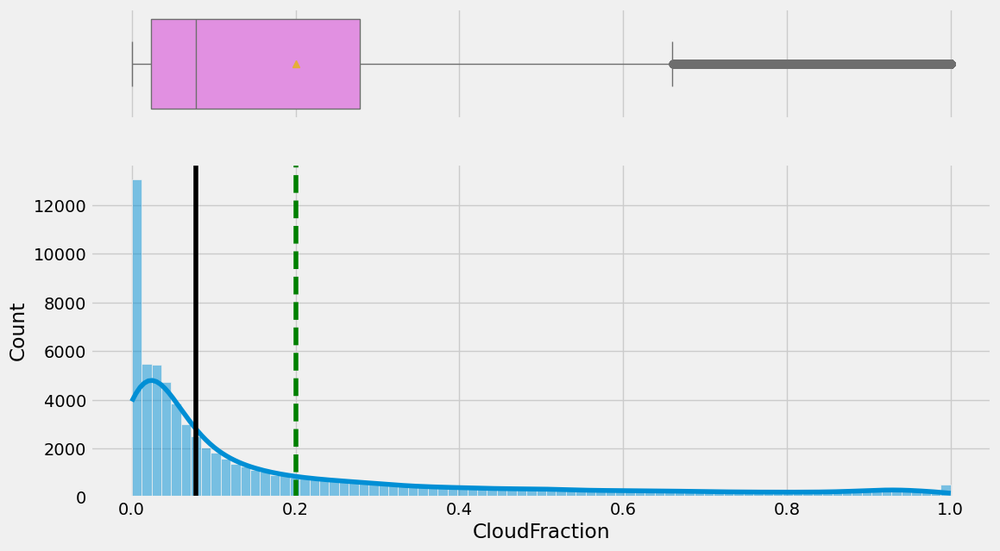

C:\Users\leeno\AppData\Local\Temp\ipykernel_31936\1706145024.py:13: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.histplot(data=data, x =feature, kde = kde, ax = ax_hist2, palette = 'winter')


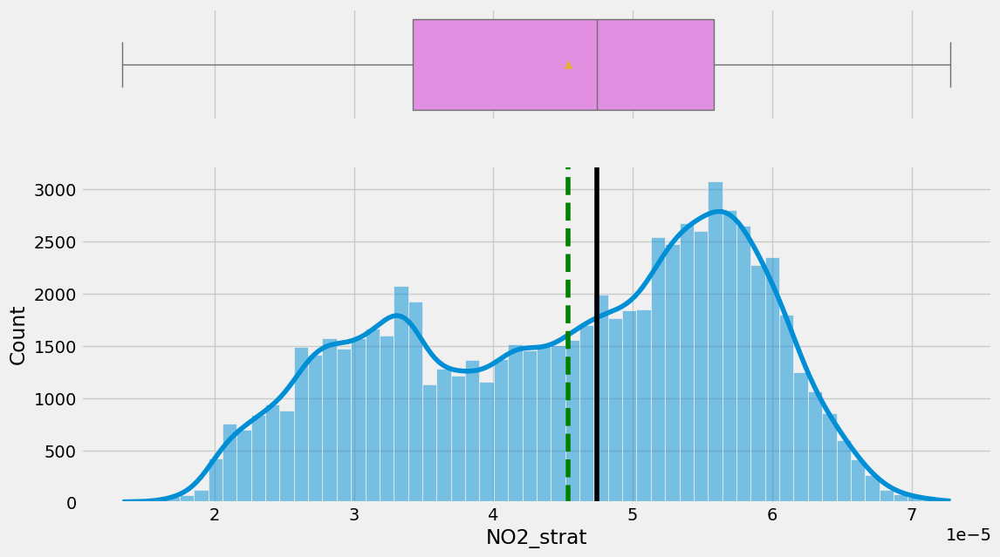

C:\Users\leeno\AppData\Local\Temp\ipykernel_31936\1706145024.py:13: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.histplot(data=data, x =feature, kde = kde, ax = ax_hist2, palette = 'winter')


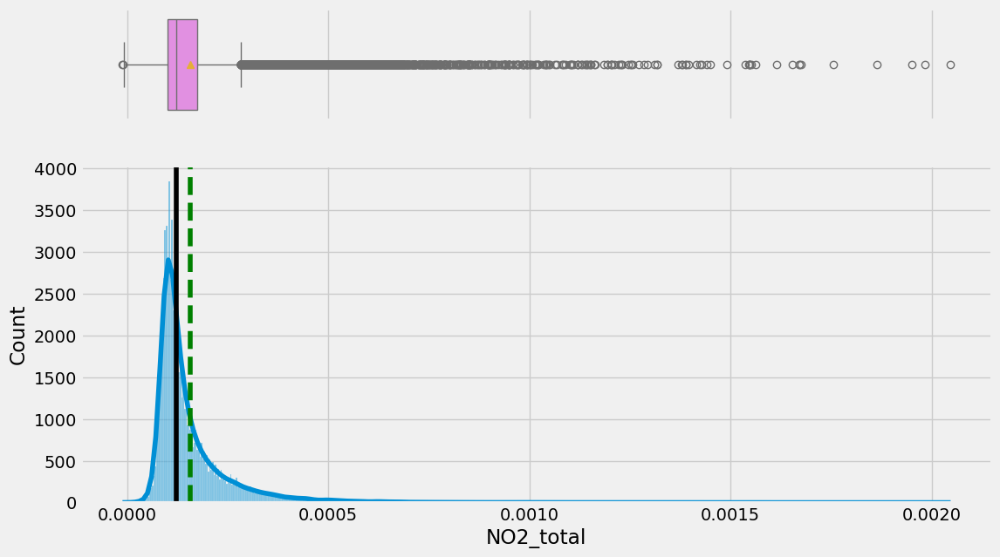

C:\Users\leeno\AppData\Local\Temp\ipykernel_31936\1706145024.py:13: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.histplot(data=data, x =feature, kde = kde, ax = ax_hist2, palette = 'winter')


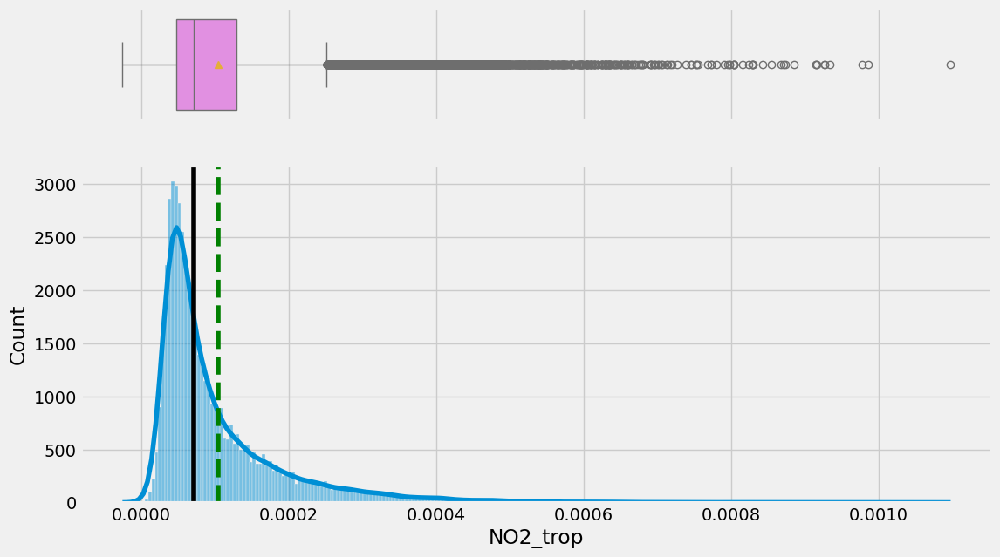

C:\Users\leeno\AppData\Local\Temp\ipykernel_31936\1706145024.py:13: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.histplot(data=data, x =feature, kde = kde, ax = ax_hist2, palette = 'winter')


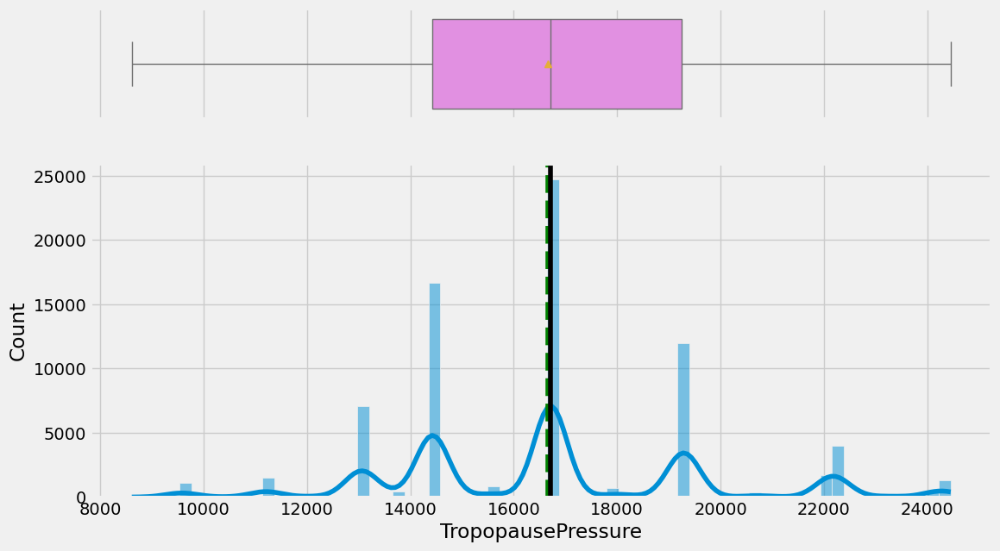

C:\Users\leeno\AppData\Local\Temp\ipykernel_31936\1706145024.py:13: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.histplot(data=data, x =feature, kde = kde, ax = ax_hist2, palette = 'winter')


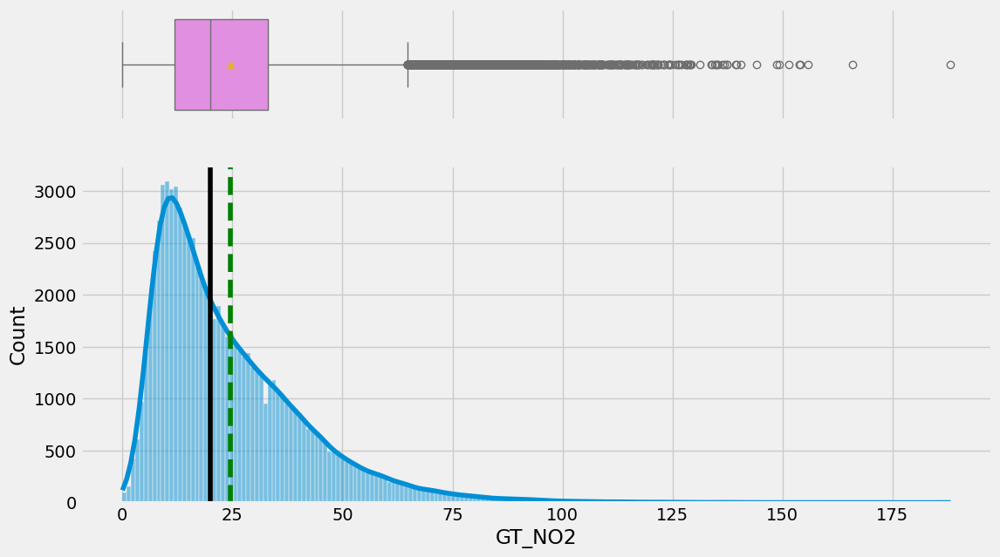

In [13]:
for col in num_df.columns:
    hist_boxplot(df, col)
    plt.show()

# Feature Engineering

Additional features for seasonality: 
- Year 
- Month
- Day

In [14]:
df['year'] = pd.to_datetime(df['Date']).dt.year
df['month'] = pd.to_datetime(df['Date']).dt.month
df['day'] = pd.to_datetime(df['Date']).dt.day
df['Date'] = pd.to_datetime(df['Date'])

C:\Users\leeno\AppData\Local\Temp\ipykernel_31936\3070227091.py:1: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df['year'] = pd.to_datetime(df['Date']).dt.year
C:\Users\leeno\AppData\Local\Temp\ipykernel_31936\3070227091.py:2: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df['month'] = pd.to_datetime(df['Date']).dt.month
C:\Users\leeno\AppData\Local\Temp\ipykernel_31936\3070227091.py:3: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df['day'] = pd.to_datetime(df['Date']).dt.day
C:\Users\leeno\AppData\Local\Temp\ipykernel_31936\3070227091.py:4: UserWarning: Could not infer f

## Lag variables

* lag ground level NO2 up to 14 days

In [15]:
df.set_index('Date', inplace=True)
df.sort_values(by=['ID', 'Date'], inplace=True)
for i in range(1, 15):
    df[f'lag{i}'] = df.groupby('ID')['GT_NO2'].shift(i)
df.columns

Index(['ID_Zindi', 'ID', 'LAT', 'LON', 'Precipitation', 'LST', 'AAI',
       'CloudFraction', 'NO2_strat', 'NO2_total', 'NO2_trop',
       'TropopausePressure', 'GT_NO2', 'year', 'month', 'day', 'lag1', 'lag2',
       'lag3', 'lag4', 'lag5', 'lag6', 'lag7', 'lag8', 'lag9', 'lag10',
       'lag11', 'lag12', 'lag13', 'lag14'],
      dtype='object')

In [16]:
df.head()

,ID_Zindi,ID,LAT,LON,Precipitation,LST,AAI,CloudFraction,NO2_strat,NO2_total,...,lag5,lag6,lag7,lag8,lag9,lag10,lag11,lag12,lag13,lag14
Date,,,,,,,,,,,,,,,,,,,,,
2019-01-01,ID_ENTGC7,PD01,45.601585,11.903551,0.000000,NaN,0.230527,0.559117,0.000024,0.000117,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2019-01-02,ID_FU6RYN,PD01,45.601585,11.903551,19.754627,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2019-01-03,ID_AXEIQP,PD01,45.601585,11.903551,0.000000,NaN,-0.366405,0.814226,0.000036,0.000110,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2019-01-04,ID_P8G3Q4,PD01,45.601585,11.903551,0.000000,302.22,-0.983072,0.050221,0.000050,0.000106,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2019-01-05,ID_85S7EJ,PD01,45.601585,11.903551,0.000000,300.52,-1.199141,0.015730,0.000063,0.000129,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


# Bi-variate

In [17]:
# Ground level NO2 over time
fig = px.line(df, x=df.index, y='GT_NO2',color= 'ID',title='Ground level NO2 over time')
fig.show()

c:\Users\leeno\anaconda3\Lib\site-packages\_plotly_utils\basevalidators.py:106: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result
  v = v.dt.to_pydatetime()


In [18]:
unique_first_letters = df['ID'].str[0].unique()
# Create separate plots for each group
for letter in unique_first_letters:
    temp_df = df[df['ID'].str.startswith(letter)]
    fig = px.line(temp_df, x=temp_df.index, y='GT_NO2', color='ID', title=f'IDs starting with {letter}')
    fig.show()

c:\Users\leeno\anaconda3\Lib\site-packages\_plotly_utils\basevalidators.py:106: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



c:\Users\leeno\anaconda3\Lib\site-packages\_plotly_utils\basevalidators.py:106: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



c:\Users\leeno\anaconda3\Lib\site-packages\_plotly_utils\basevalidators.py:106: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



c:\Users\leeno\anaconda3\Lib\site-packages\_plotly_utils\basevalidators.py:106: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



c:\Users\leeno\anaconda3\Lib\site-packages\_plotly_utils\basevalidators.py:106: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



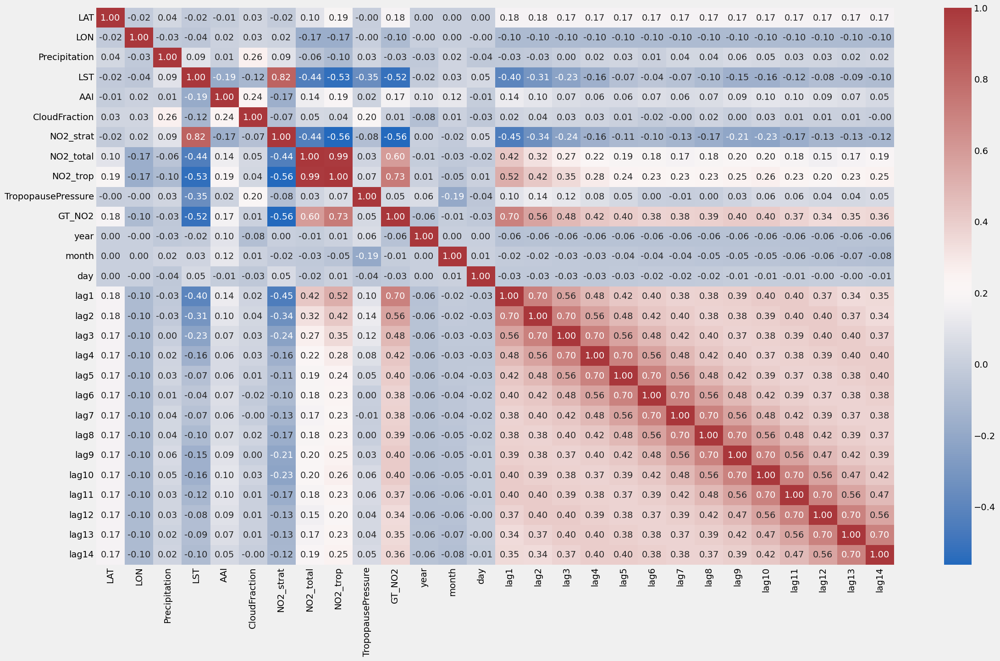

In [19]:
plt.figure(figsize=(25,15))
df_for_plt = df.select_dtypes(include=np.number)

sns.heatmap(df_for_plt.corr(), annot = True, fmt='.2f', cmap='vlag')
plt.show()

* Total vertical column of NO2 (NO2_total) and the Tropospheric vertical column of NO2 (NO2_trop) are highly corelated, 0.99. 

    Use total vertical column of NO2 instead.

* Land surface temperature (LST) and Stratospheric vertical column of NO2 (NO2_strat) are highly correlated, 0.82.



# Methods for handling na:

* 1. Algorithmic handling
* 2. Drop na

In [9]:
df_full = df.copy()
df_full = df_full.reset_index()
df_full = df_full.drop(['ID', 'ID_Zindi', 'Date'],axis=1)
df_full.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 86584 entries, 0 to 86583
Data columns (total 28 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   LAT                 86584 non-null  float64
 1   LON                 86584 non-null  float64
 2   Precipitation       86584 non-null  float64
 3   LST                 46798 non-null  float64
 4   AAI                 73709 non-null  float64
 5   CloudFraction       73709 non-null  float64
 6   NO2_strat           73709 non-null  float64
 7   NO2_total           73709 non-null  float64
 8   NO2_trop            51111 non-null  float64
 9   TropopausePressure  73709 non-null  float64
 10  GT_NO2              82051 non-null  float64
 11  year                86584 non-null  int32  
 12  month               86584 non-null  int32  
 13  day                 86584 non-null  int32  
 14  lag1                82050 non-null  float64
 15  lag2                82049 non-null  float64
 16  lag3

In [ ]:
fig = px.line(df_full, x=df_full.index, y='GT_NO2',color= 'ID',title='Ground level NO2 over time')
fig.show()

# Drop na

In [15]:
new_df = df.drop(['ID', 'ID_Zindi', 'Date'],axis=1)
new_df_drop = new_df.dropna()
new_df_drop.info()

<class 'pandas.core.frame.DataFrame'>
Index: 24760 entries, 73 to 86581
Data columns (total 28 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   LAT                 24760 non-null  float64
 1   LON                 24760 non-null  float64
 2   Precipitation       24760 non-null  float64
 3   LST                 24760 non-null  float64
 4   AAI                 24760 non-null  float64
 5   CloudFraction       24760 non-null  float64
 6   NO2_strat           24760 non-null  float64
 7   NO2_total           24760 non-null  float64
 8   NO2_trop            24760 non-null  float64
 9   TropopausePressure  24760 non-null  float64
 10  GT_NO2              24760 non-null  float64
 11  year                24760 non-null  int32  
 12  month               24760 non-null  int32  
 13  day                 24760 non-null  int32  
 14  lag1                24760 non-null  float64
 15  lag2                24760 non-null  float64
 16  lag3    

# Evaluation metric

RMSE is the metric for this notebook using the below formula:  

$ \sqrt{\frac{1}{N} \sum_{i=1}^{N} (y- \hat{y})^2}$

# Cross validation

* Time series 

Try Rolling Time Series Cross-Validation

In [16]:
from sklearn.model_selection import TimeSeriesSplit

rts = TimeSeriesSplit(max_train_size=1000)

In [17]:
x  = new_df_drop.drop('GT_NO2',axis=1)
y = new_df_drop['GT_NO2']

In [18]:
models = [XGBRegressor(), LGBMRegressor(), RandomForestRegressor()]
model_names = ['XGBRegressor', 'LGBMRegressor', 'RandomForestRegressor']
model_errors = []

for model, name in zip(models, model_names):
    errors = []
    for train_index, test_index in rts.split(x):
        x_train, x_test = x.iloc[train_index], x.iloc[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]
        model.fit(x_train, y_train)
        y_pred = model.predict(x_test)
        error = mean_squared_error(y_test, y_pred, squared=False)
        errors.append(error)
    
    # Average error for the current model
    avg_error = sum(errors) / len(errors)
    model_errors.append({'model': name, 'error': avg_error})

# Convert to DataFrame for better visualization
model_errors_df = pd.DataFrame(model_errors)
model_errors_df

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000609 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5242
[LightGBM] [Info] Number of data points in the train set: 1000, number of used features: 26
[LightGBM] [Info] Start training from score 15.450750
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000650 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5403
[LightGBM] [Info] Number of data points in the train set: 1000, number of used features: 26
[LightGBM] [Info] Start training from score 41.893675
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000627 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5422
[LightGBM] [Info] Number of data points in the train set: 1000, number of used features: 26
[LightGBM] [Info] Start trai

,model,error
0,XGBRegressor,13.795151
1,LGBMRegressor,12.298080
2,RandomForestRegressor,12.561550


# Prediction visualization

In [ ]:
predictions = {}
for model, name in zip(models, model_names):
    # Fit the model on the entire dataset
    model.fit(x, y)
    
    # Generate predictions on the entire dataset
    y_pred_full = model.predict(x)
    
    # Store predictions
    predictions[name] = y_pred_full


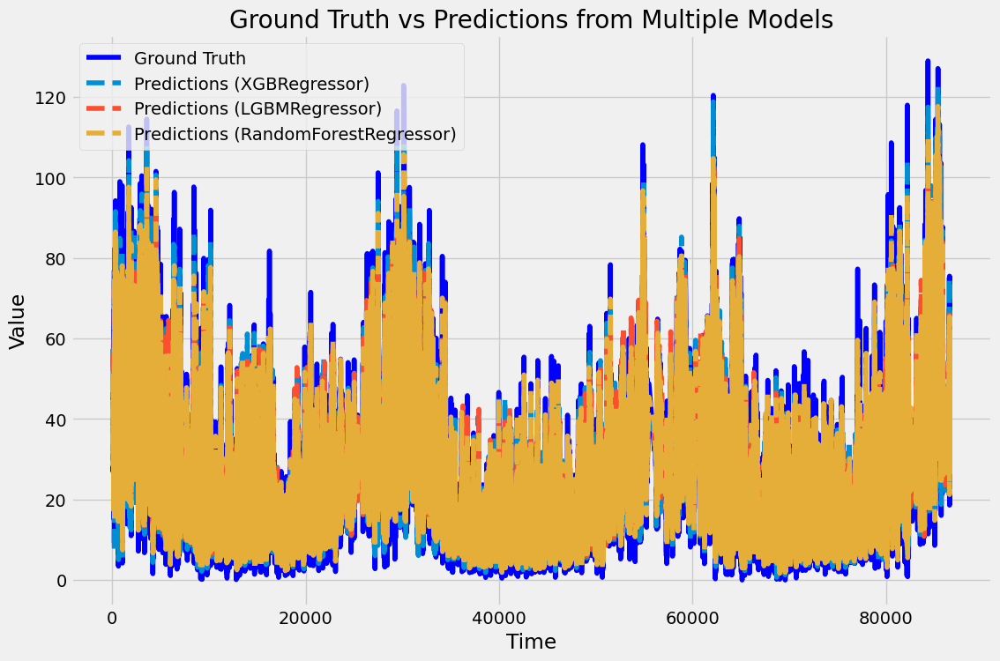

In [22]:
# Plot ground truth vs predictions for all models
plt.figure(figsize=(12, 8))

# Plot ground truth
plt.plot(y.index, y, label='Ground Truth', color='blue')

# Plot predictions for each model
for i, name in enumerate(model_names):
    plt.plot(y.index, predictions[name], label=f'Predictions ({name})', linestyle='--')

plt.xlabel('Time')
plt.ylabel('Value')
plt.title('Ground Truth vs Predictions from Multiple Models')
plt.legend()
plt.show()

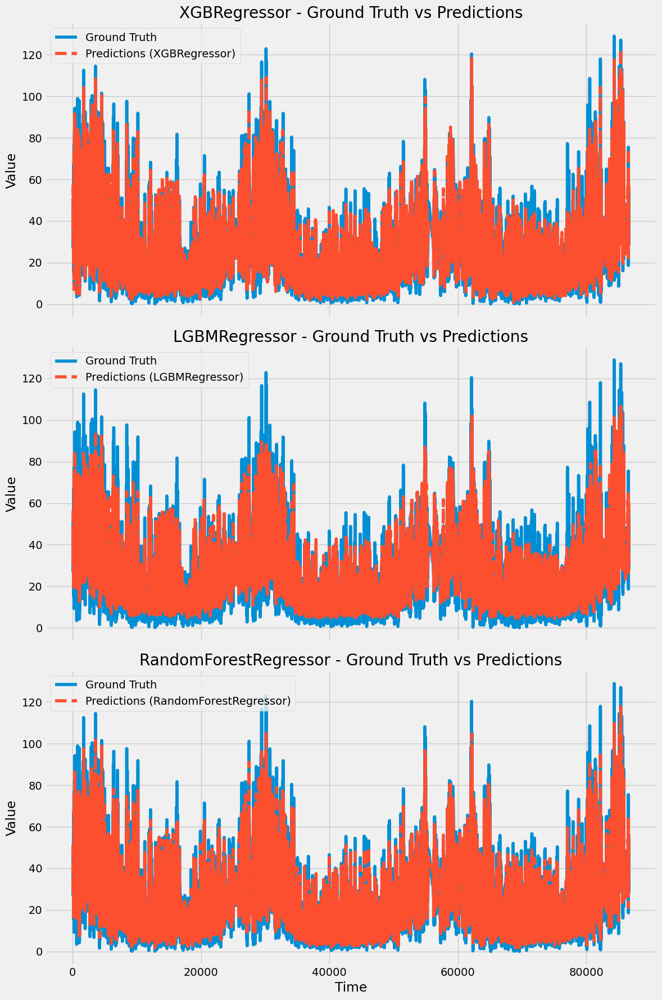

In [21]:
# Plotting
fig, axs = plt.subplots(len(models), 1, figsize=(12, 6 * len(models)), sharex=True)

for i, name in enumerate(model_names):
    axs[i].plot(y.index, y, label='Ground Truth')
    axs[i].plot(y.index, predictions[name], label=f'Predictions ({name})', linestyle='--')
    axs[i].set_ylabel('Value')
    axs[i].set_title(f'{name} - Ground Truth vs Predictions')
    axs[i].legend()

axs[-1].set_xlabel('Time')
plt.tight_layout()
plt.show()